# **Selfie to Anthropometry: Automated Detection, Segmentation, and Measurement of Human Body Metrics**

> "Measure twice, cut once"

*Author unknown*


## **Summary**
In this project we will introduce a method to extract 16 human anthropometrics from a single smartphone selfie. We will start from the end of the process with developing a deep learning model for extracting 16 human body metrics. The model is trained on a dataset with synthetic generated data containing 50K female and 50K male 2D representations of 3D body meshes in T-pose. The data is generated using a SMPL parametric model and is aquired from [Skeletex Research](http://skeletex.xyz/portfolio/datasets). For developping the model we complete a number of experiments with a wide range of models. We will use our own architecture along with transfer learning methods and will show similar MAE and MSE performance comparing to previous experiments in the domain. We will inspect and try to interpret the final models using different techiques as feature maps extraction and saliency maps. After evaluating the models over our test set with synthetic data we will use SOTA models YOLO and SAM  to detect, segment and crop a person from a selfie and try to validate the model on real people in T-pose. A practical application for such method could be in e-commerce of clothes (e.g. for recommendation of suitable sizes of clothes or even spacesuits), human body shape anomaly detection, body aging analysis or for fitness program achievement monitoring applications (every fitness addict want to know this), Biometric Security: Use body measurements as a part of a multi-factor authentication system, adding an extra layer of security in sensitive applications.

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

Put in `PROJECT` the directory where you decompressed the `data.zip` archive downloaded in part 1. Data aquisition

In [2]:
PROJECT = "."

In [3]:
import sys
sys.path.append(PROJECT)

In [4]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from tqdm import tqdm
import torch
import tensorflow as tf
from cv2 import imread, imshow, cvtColor, COLOR_BGR2RGB, IMREAD_GRAYSCALE, countNonZero
import pydot
import keras
from keras.utils import plot_model

from keras.models import Sequential, Model, load_model

from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Concatenate, GlobalAveragePooling2D

from tensorflow.keras.applications import ResNet50

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, LearningRateScheduler

from tensorflow.keras.preprocessing import image

from tensorflow.python.ops.numpy_ops import np_config


from support_module import load_and_preprocess_image, create_test_dataset, create_testset, create_test_dataset_resnet,\
                            preprocess_image_custom, create_heatmap, superimpose_heatmap,\
                            predict_measurements_and_evaluate, visualize_feature_maps, TARGET_SIZE

from transformers import TFAutoModel

Using custom module `support_module` which contains functionalities for visualisations and testing.

## **1. Data aquisition**

On the [one drive link](https://liveuniba-my.sharepoint.com/personal/madaras2_uniba_sk/_layouts/15/onedrive.aspx?ga=1&id=%2Fpersonal%2Fmadaras2_uniba_sk%2FDocuments%2FSkorvankova_etal_2021_dataset) can be found a lot  of resources, but we will use the `images` and the `annotations` archives from the link. The anotations consist of 16 body measurements aquired parametricaly from 50K male and female synthetic 3D models. The archive which we will download below consists of directories `data` and `models`. The other directories in the project archives are `notebooks` - where are the training notebooks, `models` where are the saved models, `images` - whare are the images assets, `datasets` - where are 4 csv files - `train_female.csv`, `train_male.csv`, `test_female.csv`, `test_male.csv`, `logs` - -where are all logs from the trainings, .

Use the code below to download the `data.zip` archive which contains `images`, `datasets` and `models`directories. Put them in the project folder.
Have fun!

In [5]:
##Downloading the dataset.
##If on Linux:
#!wget http://preslaff.laboletory.com/preslaff/data_science_final_project/data.zip
##Then unzip the file

#Python code
url = "http://preslaff.laboletory.com/preslaff/deep_learning_final_project/data.zip"
output_file_path = "data.zip"

response = requests.get(url, stream=True)

if response.status_code == 200:
    total_size = int(response.headers.get('content-length', 0))
    chunk_size = 1024  # You can adjust the chunk size as needed
    progress_bar = tqdm(total=total_size, unit='B', unit_scale=True)

    with open(output_file_path, "wb") as f:
        for data in response.iter_content(chunk_size=chunk_size):
            progress_bar.update(len(data))
            f.write(data)

    progress_bar.close()
    print("File downloaded successfully.")
else:
    print("Failed to download the file.")

#Or just copy and paste in your browser the hyperlink http://preslaff.laboletory.com/preslaff/ml_final_project/data.zip 

100%|██████████████████████████████████████████████████████████████████████████████████████| 1.01G/1.01G [03:49<00:00, 4.42MB/s]

File downloaded successfully.


In [5]:
SOURCE_FEMALE = PROJECT+"/data/"

## **2. Tyding, cleaning and EDA**

Let's see some examples!

In [6]:
sample_female = imread(PROJECT+"/images/female_1.png")
sample_male = imread(PROJECT+"/images/male_1.png")

In [7]:
sample_female.shape, sample_male.shape

((257, 344, 3), (257, 344, 3))

Our images are all the same size with 3 channels each.

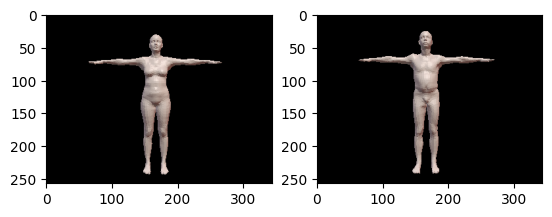

In [8]:
# Convert BGR to RGB
sample_female = cvtColor(sample_female, COLOR_BGR2RGB)
sample_male = cvtColor(sample_male, COLOR_BGR2RGB)

fig, (ax1, ax2) = plt.subplots(1, 2)

# Show two images
ax1.imshow(sample_female)
ax2.imshow(sample_male)

plt.show()

### **Load the datasets**

Let's load our annotations. We have 16 anthropometrics for each image.

In [9]:
female_data = pd.read_csv(PROJECT+"/datasets/train_female.csv")
male_data = pd.read_csv(PROJECT+"/datasets/train_male.csv")

In [11]:
female_data

,id,chest_circ,waist_circ,pelvis_circ,neck_circ,bicep_circ,thigh_circ,knee_circ,arm_length,leg_length,calf_length,head_circ,wrist_circ,arm_span,shoulders_width,torso_length,inner_leg
0,0,94.592683,81.188684,102.117434,32.246924,26.188067,51.566363,36.111285,49.741650,76.964265,39.187756,54.275426,14.578925,166.1190,32.429099,48.885596,72.406301
1,1,102.096755,102.153203,119.990393,36.538154,32.401711,57.647868,41.476742,51.440758,83.974165,42.591321,56.493098,16.791765,173.8476,34.222400,54.782706,78.903697
2,2,101.773579,82.187602,108.827697,34.353066,31.344363,58.997077,39.537964,47.785389,73.497796,37.289277,51.943943,16.297607,163.9491,32.581097,44.959998,67.942497
3,3,101.921901,82.540216,108.109131,33.270087,31.019857,56.263849,38.545433,50.496197,76.274288,38.588426,54.181637,17.564987,168.3956,32.022899,46.832901,71.875099
4,4,92.882120,81.433637,97.617266,34.508786,26.301292,47.297897,32.920912,46.226397,69.555771,35.882717,56.837605,15.508671,161.1785,31.644398,47.543597,65.831498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49895,49895,98.509545,90.464079,120.870876,33.760160,32.019039,59.846573,41.172437,52.354074,78.591377,40.054923,56.904251,15.937126,176.4496,34.399599,49.127597,73.592403
49896,49896,93.183221,82.763353,98.145227,32.934603,28.292365,47.867817,35.313561,51.359332,78.546000,40.835488,55.510535,15.005786,170.3657,33.125398,48.801500,74.364897
49897,49897,109.131702,94.780857,105.059076,34.235560,27.800304,48.814711,36.143803,49.313632,75.602955,38.938403,56.595625,16.745535,166.2698,33.211303,49.394196,71.027497
49898,49898,100.941107,88.910810,96.137170,34.572992,27.973876,43.104233,34.569699,48.987409,75.312239,38.773936,55.698970,14.483915,166.4973,33.035898,49.591696,69.755198


In [11]:
male_data

,id,chest_circ,waist_circ,pelvis_circ,neck_circ,bicep_circ,thigh_circ,knee_circ,arm_length,leg_length,calf_length,head_circ,wrist_circ,arm_span,shoulders_width,torso_length,inner_leg
0,0,83.576515,73.213088,92.503097,36.068310,22.853661,46.370356,35.224242,55.186850,84.096402,43.584922,53.987637,15.808483,182.0555,34.255001,49.249297,77.946905
1,1,101.702204,88.686590,100.846918,38.591906,28.510385,53.521642,37.731078,49.606380,73.995692,38.563633,57.345473,15.794436,171.1829,36.272103,51.644093,67.475005
2,2,104.289594,97.596672,100.898346,43.369495,28.740368,50.741101,37.595967,47.996426,71.371871,36.863151,60.638029,17.591052,170.2976,37.544197,50.525796,67.803296
3,3,118.734385,117.314673,118.804251,47.740865,38.573465,58.505852,43.587228,52.009726,77.913660,41.354027,60.986385,20.157620,186.8205,42.696899,57.420403,70.802406
4,4,104.736869,93.577234,106.010664,40.026016,33.198243,56.753582,37.691793,49.763331,73.619604,38.421023,58.549413,17.662700,176.7890,40.444499,51.284504,67.094300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49895,49895,99.269037,94.749655,100.756351,38.803220,29.172347,49.521737,38.516961,55.302376,82.040673,43.190730,58.344372,17.311997,188.1590,38.165900,52.630997,75.479099
49896,49896,97.932454,90.672830,95.847463,37.595226,27.125908,50.569628,37.373592,49.012497,75.011986,39.157870,57.676571,16.997823,172.6754,38.003400,53.155792,69.234896
49897,49897,123.875080,131.463268,129.388229,43.869675,37.231669,56.680748,44.327482,59.508097,92.217374,49.138662,66.023608,21.037311,206.4005,44.174302,65.877700,86.951505
49898,49898,86.912028,67.278628,92.563262,37.825331,24.962520,48.169913,35.170859,53.341824,81.564051,42.050964,55.206057,16.773685,181.0001,36.083099,51.368397,78.638498


In [12]:
female_data.dtypes


id                   int64
chest_circ         float64
waist_circ         float64
pelvis_circ        float64
neck_circ          float64
bicep_circ         float64
thigh_circ         float64
knee_circ          float64
arm_length         float64
leg_length         float64
calf_length        float64
head_circ          float64
wrist_circ         float64
arm_span           float64
shoulders_width    float64
torso_length       float64
inner_leg          float64
dtype: object

In [13]:
male_data.dtypes

id                   int64
chest_circ         float64
waist_circ         float64
pelvis_circ        float64
neck_circ          float64
bicep_circ         float64
thigh_circ         float64
knee_circ          float64
arm_length         float64
leg_length         float64
calf_length        float64
head_circ          float64
wrist_circ         float64
arm_span           float64
shoulders_width    float64
torso_length       float64
inner_leg          float64
dtype: object

Data types look good. We have our id's as ints which later we will use to compose the filenames for the images. Our anthropometrics are float type, which is OK for the regression task which we will do later. All anthropometrics are in centimeters. The measurements which are our targets are as folows:

The circumference of human:
- chest
- waist
- pelvis
- neck
- biceps
- thight
- knee
- head
- wrist

The lenght of human:
- arm
- leg
- calf
- torso
- inner leg

The width of human shoulders and the arm span.

Lets check the distribution of the antropometrics, to identify possible outliers or unbalance.

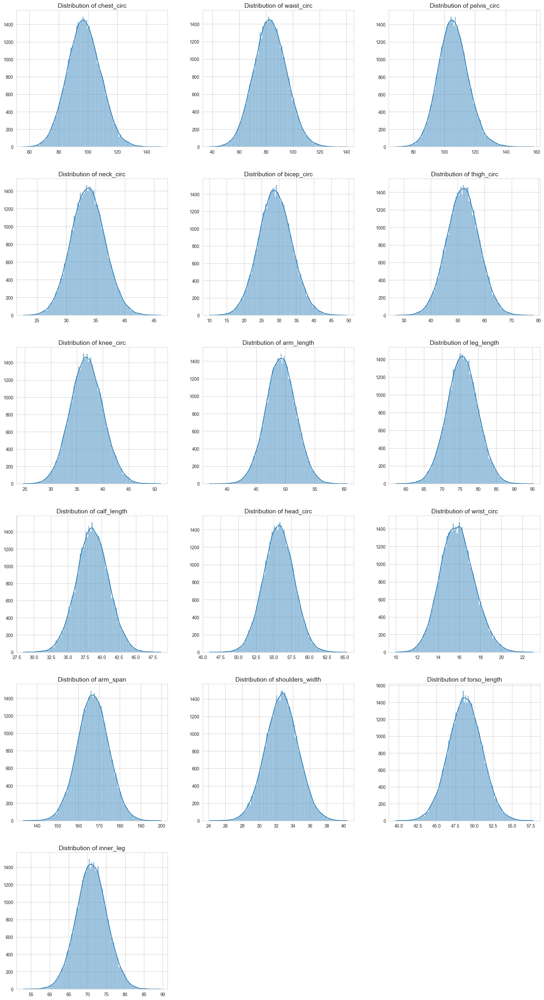

In [14]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Define the number of subplots based on the number of measurements, excluding the 'id' column
num_measurements = len(female_data.columns) - 1  # Exclude 'id' column
fig, axes = plt.subplots(nrows=num_measurements // 3 + 1, ncols=3, figsize=(18, num_measurements * 2))
fig.tight_layout(pad=5.0)

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms for each measurement
for i, column in enumerate(female_data.columns[1:]):  # Exclude 'id' column
    sns.histplot(female_data[column], ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {column}', fontsize=14)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

# Hide any unused axes if the number of measurements is not a multiple of 3
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Show the plots
plt.show()


As expected the parametric model generating synthetic data follows the standart distribution. As we can see below from the study "Anthropometric measurements for ergonomic design of students’furniture in India (Ismail Wilson Taifa a,⇑, Darshak A. Desai") the human antropometrics follow in a way the same distribution. 

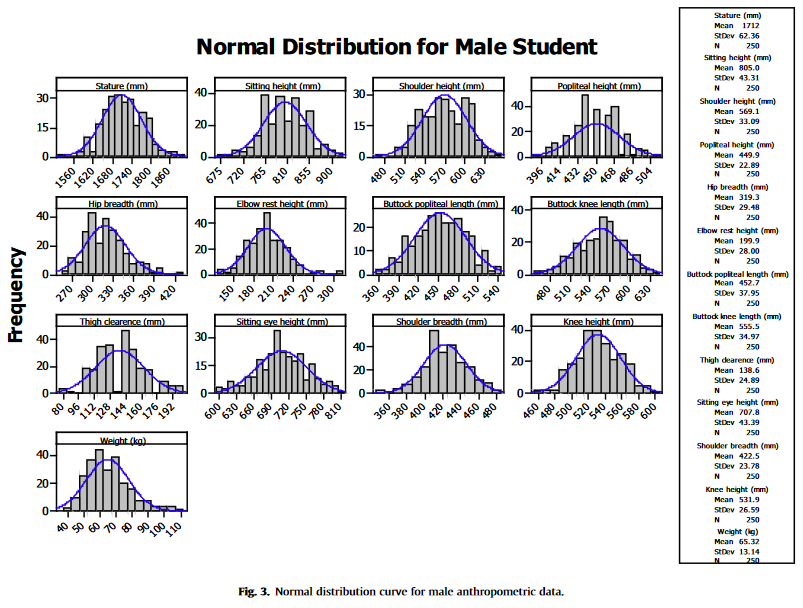

In [12]:
from IPython.display import Image, display

# Display an image by its filename
display(Image(filename=PROJECT+'/images/antropometrics-study.png'))

Let's continue with our exploration.

In [16]:
female_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49900 entries, 0 to 49899
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               49900 non-null  int64  
 1   chest_circ       49900 non-null  float64
 2   waist_circ       49900 non-null  float64
 3   pelvis_circ      49900 non-null  float64
 4   neck_circ        49900 non-null  float64
 5   bicep_circ       49900 non-null  float64
 6   thigh_circ       49900 non-null  float64
 7   knee_circ        49900 non-null  float64
 8   arm_length       49900 non-null  float64
 9   leg_length       49900 non-null  float64
 10  calf_length      49900 non-null  float64
 11  head_circ        49900 non-null  float64
 12  wrist_circ       49900 non-null  float64
 13  arm_span         49900 non-null  float64
 14  shoulders_width  49900 non-null  float64
 15  torso_length     49900 non-null  float64
 16  inner_leg        49900 non-null  float64
dtypes: float64(1

In [17]:
male_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49900 entries, 0 to 49899
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               49900 non-null  int64  
 1   chest_circ       49900 non-null  float64
 2   waist_circ       49900 non-null  float64
 3   pelvis_circ      49900 non-null  float64
 4   neck_circ        49900 non-null  float64
 5   bicep_circ       49900 non-null  float64
 6   thigh_circ       49900 non-null  float64
 7   knee_circ        49900 non-null  float64
 8   arm_length       49900 non-null  float64
 9   leg_length       49900 non-null  float64
 10  calf_length      49900 non-null  float64
 11  head_circ        49900 non-null  float64
 12  wrist_circ       49900 non-null  float64
 13  arm_span         49900 non-null  float64
 14  shoulders_width  49900 non-null  float64
 15  torso_length     49900 non-null  float64
 16  inner_leg        49900 non-null  float64
dtypes: float64(1

We don't have missing data. But our filenames are six digits numbers with leading zeros, so we need to tidy up a little and keep those leading zeros. We do this below.

In [18]:
female_data['id'] = female_data['id'].astype(str).str.zfill(6)
male_data['id'] = male_data['id'].astype(str).str.zfill(6)

Checking the data after the transformations.

In [19]:
female_data

,id,chest_circ,waist_circ,pelvis_circ,neck_circ,bicep_circ,thigh_circ,knee_circ,arm_length,leg_length,calf_length,head_circ,wrist_circ,arm_span,shoulders_width,torso_length,inner_leg
0,000000,94.592683,81.188684,102.117434,32.246924,26.188067,51.566363,36.111285,49.741650,76.964265,39.187756,54.275426,14.578925,166.1190,32.429099,48.885596,72.406301
1,000001,102.096755,102.153203,119.990393,36.538154,32.401711,57.647868,41.476742,51.440758,83.974165,42.591321,56.493098,16.791765,173.8476,34.222400,54.782706,78.903697
2,000002,101.773579,82.187602,108.827697,34.353066,31.344363,58.997077,39.537964,47.785389,73.497796,37.289277,51.943943,16.297607,163.9491,32.581097,44.959998,67.942497
3,000003,101.921901,82.540216,108.109131,33.270087,31.019857,56.263849,38.545433,50.496197,76.274288,38.588426,54.181637,17.564987,168.3956,32.022899,46.832901,71.875099
4,000004,92.882120,81.433637,97.617266,34.508786,26.301292,47.297897,32.920912,46.226397,69.555771,35.882717,56.837605,15.508671,161.1785,31.644398,47.543597,65.831498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49895,049895,98.509545,90.464079,120.870876,33.760160,32.019039,59.846573,41.172437,52.354074,78.591377,40.054923,56.904251,15.937126,176.4496,34.399599,49.127597,73.592403
49896,049896,93.183221,82.763353,98.145227,32.934603,28.292365,47.867817,35.313561,51.359332,78.546000,40.835488,55.510535,15.005786,170.3657,33.125398,48.801500,74.364897
49897,049897,109.131702,94.780857,105.059076,34.235560,27.800304,48.814711,36.143803,49.313632,75.602955,38.938403,56.595625,16.745535,166.2698,33.211303,49.394196,71.027497
49898,049898,100.941107,88.910810,96.137170,34.572992,27.973876,43.104233,34.569699,48.987409,75.312239,38.773936,55.698970,14.483915,166.4973,33.035898,49.591696,69.755198


In [20]:
male_data

,id,chest_circ,waist_circ,pelvis_circ,neck_circ,bicep_circ,thigh_circ,knee_circ,arm_length,leg_length,calf_length,head_circ,wrist_circ,arm_span,shoulders_width,torso_length,inner_leg
0,000000,83.576515,73.213088,92.503097,36.068310,22.853661,46.370356,35.224242,55.186850,84.096402,43.584922,53.987637,15.808483,182.0555,34.255001,49.249297,77.946905
1,000001,101.702204,88.686590,100.846918,38.591906,28.510385,53.521642,37.731078,49.606380,73.995692,38.563633,57.345473,15.794436,171.1829,36.272103,51.644093,67.475005
2,000002,104.289594,97.596672,100.898346,43.369495,28.740368,50.741101,37.595967,47.996426,71.371871,36.863151,60.638029,17.591052,170.2976,37.544197,50.525796,67.803296
3,000003,118.734385,117.314673,118.804251,47.740865,38.573465,58.505852,43.587228,52.009726,77.913660,41.354027,60.986385,20.157620,186.8205,42.696899,57.420403,70.802406
4,000004,104.736869,93.577234,106.010664,40.026016,33.198243,56.753582,37.691793,49.763331,73.619604,38.421023,58.549413,17.662700,176.7890,40.444499,51.284504,67.094300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49895,049895,99.269037,94.749655,100.756351,38.803220,29.172347,49.521737,38.516961,55.302376,82.040673,43.190730,58.344372,17.311997,188.1590,38.165900,52.630997,75.479099
49896,049896,97.932454,90.672830,95.847463,37.595226,27.125908,50.569628,37.373592,49.012497,75.011986,39.157870,57.676571,16.997823,172.6754,38.003400,53.155792,69.234896
49897,049897,123.875080,131.463268,129.388229,43.869675,37.231669,56.680748,44.327482,59.508097,92.217374,49.138662,66.023608,21.037311,206.4005,44.174302,65.877700,86.951505
49898,049898,86.912028,67.278628,92.563262,37.825331,24.962520,48.169913,35.170859,53.341824,81.564051,42.050964,55.206057,16.773685,181.0001,36.083099,51.368397,78.638498


Good! Now we add those file namesto the dataset. As we can see now we are ready to proceed with the preprocessing and create our tensorflow dataset which we will use in the training process.

In [21]:
female_data['filename'] = female_data["id"].astype(str)+".png"
male_data['filename'] = male_data["id"].astype(str)+".png"

In [22]:
female_data.filename

0        000000.png
1        000001.png
2        000002.png
3        000003.png
4        000004.png
            ...    
49895    049895.png
49896    049896.png
49897    049897.png
49898    049898.png
49899    049899.png
Name: filename, Length: 49900, dtype: object

## **3. Feature selections, preprocessing and creating tensorflow datasets**

## **3.1. Features selection**


We select the features and the targets.As we have 50K images with dimension 257x344 we need to use deep neural networks to extract all features. We will use a number of models to extract the features from our image dataset using the `filename` column from the dataframe and our measurements as the targets for the training using all other columns. We do this in the function `create_datasets(dataframe, source, batch_size, train_size, shuffle_buffer_size)` below.  

### **3.2. Preprocessing**

We define a function which will preprocess our images in suitable format for the transfer learning from ResNet50 task. We will use the real size of our image, but this is not a problem for ResNet50. For the `source` property in the functions below we use the constants defined as `SOURCE_FEMALE` and `SOURCE_MALE` in the beginning where we put the directories with the images from the image dataset.

In [23]:
# Reading and resizing images. Preprocessing for ResNet and for Custom CNN model
def preprocess_image(image_path, measurements, source):
    # Read the image
    image = tf.io.read_file(source+image_path)
    image = tf.image.decode_png(image, channels=3)

    # Resize the image to match ResNet50 input
    image = tf.image.resize(image, [257, 344])

    # Resize the image to a square by cropping the central part, then to 224x224 for Custom model
    # image = tf.image.resize_with_crop_or_pad(image, 344, 344)  # Crop to square
    # image = tf.image.resize(image, [224, 224])  # Resize to the desired input size

    # Normalize the image
    image = tf.keras.applications.resnet50.preprocess_input(image)

    return image, measurements

## **3.3. Creating tehsorflow dataset**

We use `from_tensor_slices()` to feed and preprocess the data into the model by batches on the fly enabling efficient batching, shuffling, and other data transformations. We set the `batch size=32` , a train/validate ratio 85/15 and shuffle buffer as much is the dataset (to use all images when shuffling). Using `map()` to preprocess every batch. Using `seed=42` for reproduction purposes. We use `num_parallel_calls=tf.data.AUTOTUNE` to improve CPU utilization in data loading and preprocessing  and reduce bottlenecks before data is fed into the model for training or inference on the GPU. We use `prefetch(tf.data.AUTOTUNE)` for dynamically adjusting the number of elements to prefetch, optimizing the data pipeline to improve runtime efficiency.

In [24]:
def create_datasets(dataframe, source, batch_size, train_size, shuffle_buffer_size):
    image_paths = dataframe["filename"].values
    measurements = dataframe[["chest_circ", "waist_circ", "pelvis_circ", "neck_circ", "bicep_circ", "thigh_circ", "knee_circ",	"arm_length", "leg_length", "calf_length", "head_circ", "wrist_circ",	"arm_span", "shoulders_width", "torso_length", "inner_leg"]].values

    #Creating the tf Dataset
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, measurements))

    # Shuffle the dataset
    dataset = dataset.shuffle(buffer_size=shuffle_buffer_size, seed=42, reshuffle_each_iteration=True)

    num_train_samples = int(len(dataset) * train_size)
    train_dataset = dataset.take(num_train_samples).map(lambda x, y: preprocess_image(x, y, source),num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    validation_dataset = dataset.skip(num_train_samples).map(lambda x, y: preprocess_image(x, y, source), num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return train_dataset, validation_dataset

Our source datasets consists of 49900 each. We left 100 samples for the testing dataset.

In [25]:
female_data.shape[0] , male_data.shape[0]

(49900, 49900)

In [26]:
train_dataset_female, validation_dataset_female = create_datasets(female_data, SOURCE_FEMALE, batch_size=32, train_size=0.85, shuffle_buffer_size=female_data.shape[0])

In [27]:
train_dataset_female

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 257, 344, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 16), dtype=tf.float64, name=None))>

Our datasets are ready.

Let's look at one batch of the dataset!

In [28]:
for image, measurements in train_dataset_female.take(1):
    print("Image shape:", image.shape)
    print("Measurements shape:", measurements.shape)

Image shape: (32, 257, 344, 3)
Measurements shape: (32, 16)


Looks good, but how can we be sure that our training and validating data share similar distributions? Images are syntheticaly generated with the same
Let's check. For this task we will need to unbatch a sample of the data for every feature and look at its distribution histogram.

In [29]:
def extract_measurements(dataset):
    all_measurements = []
    for _, measurements in dataset.unbatch().take(500):  # number of batches to unbatch
        all_measurements.append(measurements.numpy())
    return np.array(all_measurements)

In [30]:
# Extract measurements from the datasets
train_measurements = extract_measurements(train_dataset_female)  # Assuming train_dataset_female is already batched
validation_measurements = extract_measurements(validation_dataset_female)

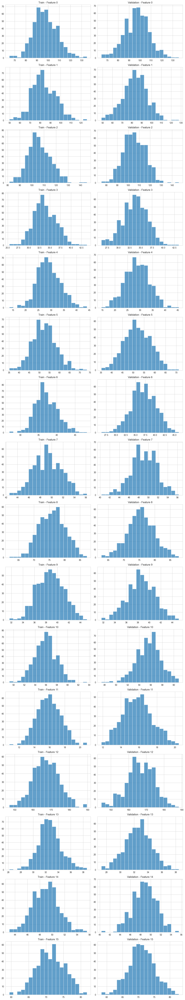

In [31]:
# Plot histograms for each measurement
# def measurements_histogram(dataframe):
num_measurements = train_measurements.shape[1]
fig, axes = plt.subplots(num_measurements, 2, figsize=(12, 4 * num_measurements))

for i in range(num_measurements):
     axes[i, 0].hist(train_measurements[:, i], bins=20, alpha=0.7, label='Train')
     axes[i, 0].set_title(f'Train - Feature {i}')
     axes[i, 1].hist(validation_measurements[:, i], bins=20, alpha=0.7, label='Validation')
     axes[i, 1].set_title(f'Validation - Feature {i}')

plt.tight_layout()
plt.show()

On every row we have a histogram showing the distribution in training and validation dataset for every target feature. They look pretty similar with one another whisch is necessary for the proper running of the training process.

## **4. Experiments**

Below we will explain the details about the training process and the used loss functions, optimizers and training setup. Next we will show and explain used architectures and methods.


### **Loss Functions:**

We use two types of  loss functions suitable for the regression task - Custom loss and MAE.

Our custom loss function is a variation of Mean Absolute Error (MAE) with an added penalty as MSE - if the absolute error between the predicted and true values exceeds a certain threshold (0.5 cm), this error is given a higher penalty (multiplied by 2.0).

This function was used when we train the female dataset, because after previous experiments using MSE our model didn't generalize well some of the target features  - chest, waist and pelvis in comparison with the other features. This approach give us stronger penalty from MAE and not so extreme as is using MSE. The first run is done with it.

In [32]:
@keras.saving.register_keras_serializable()
def custom_loss_function(y_true, y_pred):
    threshold = 0.5
    error = tf.abs(y_true - y_pred)
    higher_penalty = 2.0
    loss = tf.where(error > threshold, higher_penalty * error, error)
    return tf.reduce_mean(loss, axis=-1)

### MAE - Mean Absolute Error

Next we reverted to MAE as our loss function, because we didn't see any improvement in the model convergence and because MAE is better to interpret and stronger to outliers.

$$\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} |y_{i} - \hat{y}_{i}|$$

Where:

- $n$ is the number of observations.
- $yi$​ is the actual value of the ii-th observation.
- $y^​i$​ is the predicted value of the ii-th observation.
- The absolute value of the difference $∣yi​−y^​i​∣$ is averaged over all observations.


### MAPE

During the training we watch the MAPE (Mean Absoluet Percentage Error) too. The Mean Absolute Percentage Error (MAPE) is a metric that expresses accuracy as a percentage.

It is calculated using the formula:

$$\text{MAPE} = \frac{100\%}{n} \sum_{i=1}^{n} \left| \frac{y_{i} - \hat{y}_{i}}{y_{i}} \right|$$

Where $yi$​ represents the actual value, $y^​i$​ represents the predicted value, and nn is the number of observations.

The benefit of MAPE over MAE (Mean Absolute Error) is that MAPE provides a relative measure of error, making it easier to interpret, especially when dealing with diverse datasets where the scale of the target variable might vary significantly. MAPE is particularly useful when you want to understand the size of the errors in percentage terms, giving a more intuitive understanding of the average error's impact. However, it's important to note that MAPE can be problematic when dealing with zero or near-zero actual values, as it leads to division by zero or very large errors.

### **Optimizers**

We begin with Adam optimizer with default settings `(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False)` when training the model with ResNet50 backbone. In the next runs we tuned the `learning_rate=0.0005` using  AMSGrad instead of Adam, to prevent the oscillations of the `validation_loss` which happened during the training. For our custom model we used first exponential decrease in the learning rate (from `learning_rate = 0.0005`), but the values became too small in the last epochs and we switched to `CosineDecay` using learning scheduler decreasing the rate from 0.0005 to 0.0001. This method showed best results.

### **Setup**

We will use MLflow with Databricks to log our experiments. You have to be registrred for the Community edition of Databricks: https://community.cloud.databricks.com . We will use `ModelCheckpoint` to save checkpoints for our best models. Checkpoint files are in folder `checkpoints`. Saved model files are in format `model-{epoch:02d}-{val_loss:.2f}.keras` . We use `TensorBoard` to log our runs and custom class to log the learning rate.

## **4.1. Transfer Learning from ResNet50**

We use a pre-trained ResNet50 model as the backbone and as a capable feature extractor. This introduces knowledge learned from real-world images (from ImageNet). ResNet50 is a powerfull CNN with residual connections to handle the problem with vanishing/exploiding gradients.

### **4.1.1. Modeling**

### **Cut the head and freeze the body**

In [33]:
base_model = ResNet50(input_shape=(257, 344, 3), # Defining the base model and cutting classification head. We will use 'imagenet' weights.
                                            include_top=False,
                                            weights='imagenet')

base_model.trainable = False  # Freeze layers for transfer learning

As we can see the last layer is convolutional and is the output of our backbone model with a bunch of parameters.

### **Custom Layers for Regression:**

We then add custom layers on top of ResNet50 to output our 16 target measurements. We will use `GlobalAveragePooling2D` for dimensionality reduction, and two Dense layers for the regression. The last Dense layer will give us the 16 measurements. We will use the default behavior of the `Dense` layer - direct reggression.

In [34]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
output = Dense(16)(x)  # No activation, direct regression

Finally we assemble our model.

In [35]:
transfer_model = Model(inputs=base_model.input, outputs=output)

As we can see below we have 178 layers. A complicated architecture which hopefully will do the job.

In [36]:
transfer_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 257, 344, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 263, 350, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 129, 172, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 129, 172, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [37]:
# These are the details of the last three layers

for i, layer in enumerate(transfer_model.layers[-3:], start=1):
    print(f"Layer {i}: {type(layer).__name__}")
    print("Configuration:", layer.get_config())
    print("Output Shape:", layer.output_shape)
    print("Input Shape:", layer.input_shape)
    print("Layer Name:", layer.name)
    print("Trainable:", layer.trainable)
    if hasattr(layer, 'get_weights'):
        print("Weights:", layer.get_weights())
    print("\n")

Layer 1: GlobalAveragePooling2D
Configuration: {'name': 'global_average_pooling2d', 'trainable': True, 'dtype': 'float32', 'data_format': 'channels_last', 'keepdims': False}
Output Shape: (None, 2048)
Input Shape: (None, 9, 11, 2048)
Layer Name: global_average_pooling2d
Trainable: True
Weights: []


Layer 2: Dense
Configuration: {'name': 'dense', 'trainable': True, 'dtype': 'float32', 'units': 1024, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}
Output Shape: (None, 1024)
Input Shape: (None, 2048)
Layer Name: dense
Trainable: True
Weights: [array([[-0.01430982,  0.00198792, -0.01571444, ...,  0.04178714,
     

As we can see the dimensionality is reduced from 9 * 11 * 2048 = 202,752 to 2048. This reduction significantly decreases the complexity of the data that is passed to the subsequent layers, facilitating easier and more efficient processing. We use GlorotUniform as initial state for the weights.

In [38]:
len(transfer_model.layers)

178

We can see the residual blocks in our model below and the regression head in the end of the model.

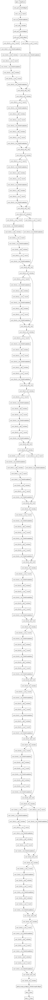

In [39]:
plot_model(transfer_model)

This is our regression head below.

In [40]:
transfer_model.layers[-3:]

### **4.1.2 Gradient analysis**

In order to identify possible problems with the training process we will make gradient analysis by passing forward and backwards through the model a sample of data batches. We will plot a histogram showing the distribution of the gradients.

We use Adam optimizer with default values for the hyperparameters for the analysis.

In [41]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

In [42]:
transfer_model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=["mean_absolute_percentage_error"])

We will use this function to make forward pass, loss calcultaion, back propagation and update the weights of the model with a small batch of our dataset because of the computational restrictions.

In [43]:
@tf.function
def train_step(inputs, targets, model):
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)
        # Directly use the specified loss function instead of model.loss
        loss = tf.keras.losses.mean_absolute_error(targets, predictions)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return gradients, loss

We take 10 sample batches from the data.

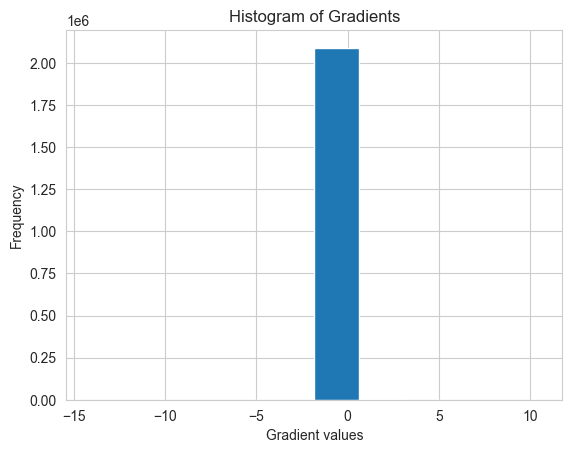

In [44]:

# training loop for one epoch
for inputs, targets in train_dataset_female.take(10):
    gradients, loss = train_step(inputs, targets, transfer_model)
    # Here you can log the loss, etc.

#  plot the histogram 
plt.hist(gradients[0].numpy().flatten(), bins=10)
plt.title('Histogram of Gradients')
plt.xlabel('Gradient values')
plt.ylabel('Frequency')
plt.show()

As expected a model with 2.5M trainable parameters have a lot of them around 0. We have to consider technics to keep the gradients (as ResNet do) using proper activations and optimizers. With too small learning rate the model may not be able to escape from the current region in the parameter space, resulting in small gradients. We will use a standart batch size and not smaller than 32 samples.   

### **4.1.3 Training**

### Training process is in notebook - **[Transfer-Learning-ResNet.ipynb](notebooks/Transfer_Learning_ResNet.ipynb)**

## **4.2. Vision Transformer and ResNet50 as feature extractors**

ResNet50 is a very good feature extractor but what about combine it with another one. We made an experiment harnessing the power ot convolutions and attentions using Vision Transformer. We hope that combining the two approaches ResNet with its spacial understanding and the Transformer with its more general understanding capturing the global dependencies in the data.

### **4.2.1 Modeling**

In [45]:
# Load the pre-trained ResNet50 model without its classification head
resnet50 = ResNet50(include_top=False, weights='imagenet', input_shape=(224, 224, 3), pooling='avg')

vit_model = TFAutoModel.from_pretrained('google/vit-base-patch16-224-in21k')

# Make sure both base models are not trainable to freeze their weights
resnet50.trainable = False
vit_model.trainable = False


# Define the input layer
input_layer = Input(shape=(224, 224, 3))

# Get feature representations from ResNet50 model
resnet_features = resnet50(input_layer)

# Transpose dimensions for ViT model
# TensorFlow format: (batch_size, height, width, channels)
# Expected format: (batch_size, channels, height, width)
vit_input = tf.transpose(input_layer, [0, 3, 1, 2])

# Get feature representations from ViT model
vit_features = vit_model(vit_input)[0]
vit_features = Flatten()(vit_features[:, 0, :])  # Take the [CLS] token's output

# Concatenate the features from both models
concatenated_features = Concatenate()([resnet_features, vit_features])

# Add additional dense layers for regression or classification
x = Dense(2048, activation='relu')(concatenated_features)
x = Dropout(0.5)(x)
x = Dense(16)(x)  # Assuming we want to perform regression with 16 outputs

# Create the final model
vitres_model = Model(inputs=input_layer, outputs=x)


All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


In [46]:
vitres_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 tf.compat.v1.transpose (TF  (None, 3, 224, 224)          0         ['input_3[0][0]']             
 OpLambda)                                                                                        
                                                                                                  
 tf_vi_t_model (TFViTModel)  TFBaseModelOutputWithPooli   8638924   ['tf.compat.v1.transpose[0][0]
                             ng(last_hidden_state=(None   8         ']                            
                             , 197, 768),                                                   

The model has a significant number of trainable parameters enabling a powerfull feature extraction performance. Between the two Dense layers we put a Dropout to decrease the possible overfitting.

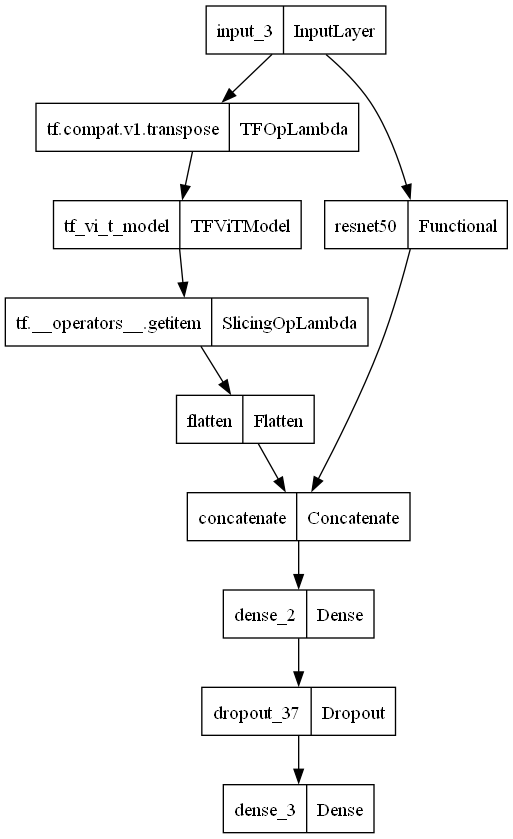

In [47]:
plot_model(vitres_model)

As we can see we use Vision Transformer and ResNet50 to extract features(feature maps) then we cancatenate the results , flatten them and feed them into the regression head.

### **4.2.2 Gradient analysis**

In [48]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

We have to preprocess and create our dataset for the standart 224x224 size of the ViT input

In [49]:
test_set = create_testset(female_data, SOURCE_FEMALE, batch_size=32, train_size=0.85, shuffle_buffer_size=female_data.shape[0])

In [50]:
@tf.function
def train_step(inputs, targets, model):
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)
        # Directly use the specified loss function instead of model.loss
        loss = tf.keras.losses.mean_absolute_error(targets, predictions)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return gradients, loss

Agein we take 10 samples from the data.

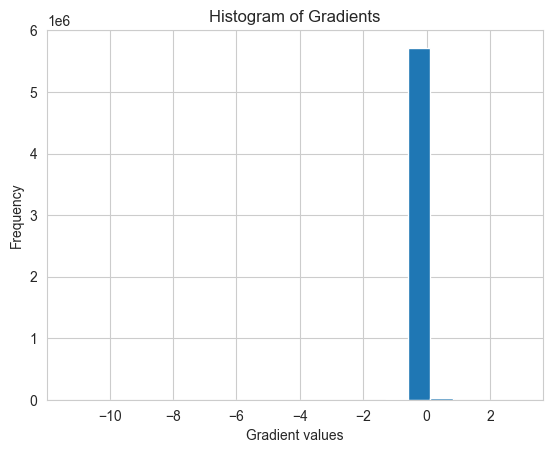

In [51]:
# training loop for one epoch
for inputs, targets in test_set.take(10):
    gradients, loss = train_step(inputs, targets, vitres_model)
    # Here you can log the loss, etc.

#  plot the histogram 
plt.hist(gradients[0].numpy().flatten(), bins=20)
plt.title('Histogram of Gradients')
plt.xlabel('Gradient values')
plt.ylabel('Frequency')
plt.show()

The model is double the size of ResNet with more tnah 5M parameters. This explains again the concentration of gradients around 0. We will consider using the same training techniques as with ResNet transfer model.

### **4.2.2 Training**

### Training process is in notebook - **[ResNet-ViT-Feature-Extractor.ipynb](notebooks/ResNet-ViT-Feature-Extractor.ipynb)**



## **4.3. Custom CNN**
We use own CNN architecure to try to simplify the architecture regarding the simplicity of the data. The units in the convolution layers are increasing from 20 to 64 in the last fully connected layer, and we use different filters decreasing from 5x5 to 3x3 in the last layer. This way we hope to catch5 the diversity of the data and extract more usefull features. We use MaxPooling after every convolutional layer as a form of dimensionality reduction. At the end of the feature extraction block it is connected through a Flatten() layer with a regression head with two fully connected Dense layers. All activations are RELU in order to insert non-linearity in the CNN allowing the network to learn complex patterns. In ReLU all negative values are set to zero, which means that it produces sparse representations. Sparsity can lead to more efficient models by reducing the number of active neurons at the same time, hence reducing computational load. The last Dense layer is with linear activation and makes 16 linear regressions to extract the 16 measures of the human body.

In [52]:
custom_model = Sequential([
    # Convolutional layer block 1
    Conv2D(20, kernel_size=(5, 5), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer block 2
    Conv2D(25, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer block 3
    Conv2D(25, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer block 4
    Conv2D(64, kernel_size=(5, 5), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer block 5
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Flatten the output of the last convolutional block
    Flatten(),

    # Dense layer
    Dense(128, activation='relu'),

    #Dropout(0.2)

    # Output layer for regression, with 16 units for 16 measurements
    Dense(16)  # No activation function is used because this is a regression problem
])


In [53]:
custom_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 20)      1520      
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 20)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 25)      12525     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 25)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 49, 49, 25)        15650     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 24, 24, 25)        0

This custom CNNs use convolutional layers (Conv2D) to detect local features like edges, textures, and shapes in small regions of the image, making them adept at understanding spatial hierarchies in visual data. The same filter (weights) is used across different parts of an image. This reduces the number of parameters, leading to a more efficient learning process and reduced risk of overfitting. Through pooling layers, CNNs can reduce the spatial dimensions (height and width) of the image representation, emphasizing the most important features and reducing computational load.

You need graphviz installed for ploting model structure. Instructions from [here](https://forum.graphviz.org/t/new-simplified-installation-procedure-on-windows/224)

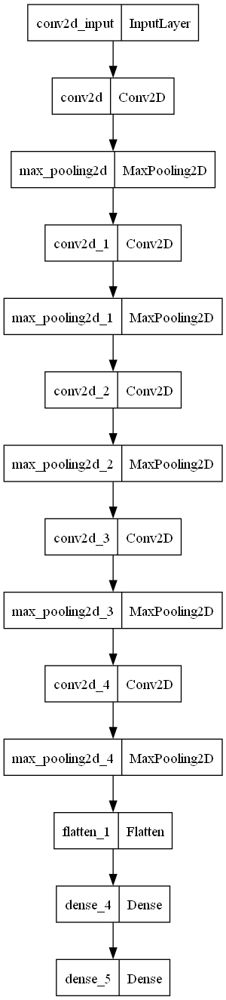

In [54]:
plot_model(custom_model)

As we can see the dimensionality is reduced from  9 * 11 * 2048 = 202,752 to 2048. This reduction significantly decreases the complexity of the data that is passed to the subsequent layers, facilitating easier and more efficient processing. We use `GlorotUniform` as initial state for the weights.

In [55]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

In [56]:
custom_model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=["mean_absolute_percentage_error"])

In [57]:
@tf.function
def train_step(inputs, targets, model):
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)
        # Directly use the specified loss function instead of model.loss
        loss = tf.keras.losses.mean_absolute_error(targets, predictions)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return gradients, loss

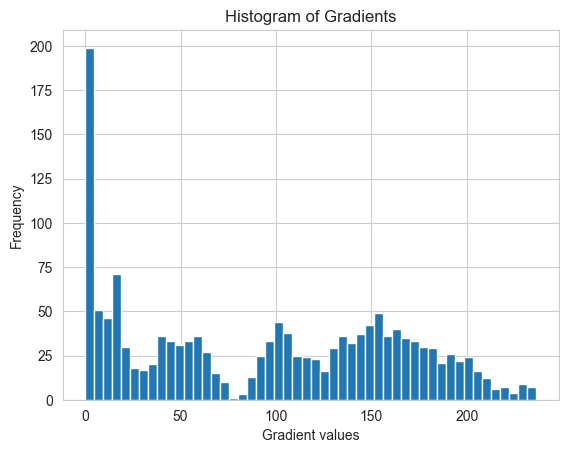

In [58]:

# training loop for one epoch
for inputs, targets in test_set.take(10):
    gradients, loss = train_step(inputs, targets, custom_model)
    # Here you can log the loss, etc.

#  plot the histogram 
plt.hist(gradients[0].numpy().flatten(), bins=50)
plt.title('Histogram of Gradients')
plt.xlabel('Gradient values')
plt.ylabel('Frequency')
plt.show()

As expected a simple model has smaller number of parameters and the influence of every parameter is bigger, so are the values of the gradients. Again there is a significant concentration of gradients near zero. We will consider using a learning rate scheduler to decrease the learning rate as training progresses. The distribution has a long tail towards the larger positive gradient values, and with more than 10 batches passed through the model the tail is towards negative values. Probably this is because we passed the data only once an the model still have a lot to learn. The concentration of gradients near zero might indicate that the weight initialization could be improved too.

### **4.3.2 Training**

### Training process is in notebook - **[Custom-Model-Experiments.ipynb](notebooks/Custom_Model_Experiments.ipynb)**

## **5. Training process analysis**

We made multiple runs, due to different reasons mostly reconnections of Google Drive. First run is with our custom loss, Run 2 and 3 didn't started from the beginning, run 4 had wrong validation set (mistakenly using the male dataset with female training set), runs 5 and 6 finished 100 epochs.

In [59]:
keras.backend.clear_session()

In [2]:
reload_ext tensorboard

In [4]:
tensorboard --logdir logs

### **ResNet**

**Run 1**
   
We use our custom loss function with optimizer Adam. There's a exponential decrease in loss after the first epochs, which is expected as the model begins to learn the data. The validation loss follows the training loss closely for the initial epochs and the model generalize well to unseen data during this period. Around epoch 30 and beyond, there are significant oscillations in validation loss. This spikes could be an indication that the modeis starts to overfit the training data, or it could be due to a noise in the validation data. The learning rate might be too high, causing the model to miss the optimal weights during optimization.After all both losses are decreasing close to the end, which is a good sign. In the final epochs, the losses appear to be converging, suggesting that the model is stabilizing. So we decided to decrease the learning rate to 5e-1 and use more stable version of Adam - AMSGrad that ensures that the learning rates do not increase unexpectedly, leading to more stable and consistent convergence.

**Run 2**

We use MAE as loss function. The learning curve is smoother than Run 1 with fewer oscillations in validation loss and we havve more stable training process. The training and validation losses are decreasing and seem to be converging. There's is a gap between the training and validation loss, which could suggest some overfitting but it didn't  increase ovetime and the validation loss didn't increase. In the end of the training epochs, both losses tend to flatten out, suggesting that the model might be approaching its performance limit given the current architecture and data.

**Run 3**
We use MAE as loss function and Cosine Decay as learning rate scheduler. The learning rate shows typical cosine curve, decresing from 0.0005 to 0.0001 in the last epoch. There is no significant gap between training and validation curves, which means that the model doesn't overfit over the data. There are less spikes in the validation loss too. The final MAE error is smaller than the previous run. The model seems to converge well. This is the last and best run so far.

### **Vision Transformer and ResNet50**

**Run 1**
We use exponential decrease of the learning rate. From the beggining the training and valiation curves tend to maintain certain gap which indicates an overfitting model. In a manner this is expected when using two powerfull feature extractors over significantly simple dataset. The time between epochs triples, so we stopped the process.

### **Custom CNN**
**Run 1**
Failed

**Run 2**
We use learning rate scheduler from 5e-4 to 1e-4 with cosine decay. In the firsts steps there is a significant fall in training loss learning curve from a significantly high position, which is a signal that models learns. Validating loss is smaller thna the training whisch is expected as the validation set is smaller. After the initial drop, the training loss continues to decrease but at a slower rate, showing signs of convergence as the model begins to stabilize. There are some spikes in the training loss, which could be due to the variability of the learning rate. Overfitting would be indicated by a divergence where the training loss continues to decrease while the validation loss increases or plateaus. by the end both losses seem to be converging, which is indicated by the flattening of the curves towards the end of the training. This suggests that the model is reaching its capacity to learn from the data given the current architecture and hyperparameters.

    

## **6. Model evaluating & testing**



### **6.1. Evaluate**

Let's evaluate our two best performing models - The ResNet transfer learning model and out custom architecture

### **ResNet**

In [62]:
transfer_model.load_weights("./models/model-84-0.89.h5")

In [63]:
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate=0.000228, decay_steps=10000, alpha=0.5)

In [64]:
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, amsgrad=True)

In [65]:
transfer_model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=['mean_absolute_percentage_error'])

In [66]:
test_female = pd.read_csv(PROJECT+"/datasets/test_female.csv")

In [67]:
test_female['id'] = test_female['id'].astype(str).str.zfill(6)
test_female['filename'] = test_female["id"].astype(str)+".png"

In [68]:
test_dataset_resnet = create_test_dataset_resnet(test_female, SOURCE_FEMALE, 32)

In [69]:
# Now evaluate the model
loss, accuracy = transfer_model.evaluate(test_dataset_resnet)

print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")



4/4 [==============================] - 9s 2s/step - loss: 0.9639 - mean_absolute_percentage_error: 1.9745
Test Loss: 0.9639475345611572, Test Accuracy: 1.9745490550994873


We got 0.96 loss over the test set. Comparing with the training and the validation loss this is less than 0.06 which is 6 mm. The test accuracy here is actualy test inaccuracy, or metric as the mean absolut percentage error. Not a bad result comparing with the 1.84% mean absolute percentage error achieved during the training process.  Not bat results on never seen data. But let's not forget that this is synthetic data. We expect worse results over real images of humans. Later we will test the models over real picture of a man standing in T-pose.

### **Custom CNN**

In [70]:
custom_model.load_weights("./models/model-99-0.46.h5")

In [71]:
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate=0.000228, decay_steps=10000, alpha=0.5)

In [72]:
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, amsgrad=True)

In [73]:
custom_model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=['mean_absolute_percentage_error'])

In [74]:
# Create the test dataset
test_dataset = create_test_dataset(test_female, SOURCE_FEMALE, 32)

# Now evaluate the model
loss, accuracy = custom_model.evaluate(test_dataset)

print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")


4/4 [==============================] - 1s 64ms/step - loss: 0.4952 - mean_absolute_percentage_error: 1.0386
Test Loss: 0.4951661229133606, Test Accuracy: 1.0386241674423218


### **6.2. Testing**
We will test our new model with the testing datasets in  `datasets/test_female.csv` and `datasets/test_male.csv` to predict all the measuments from . These are 100 samples which the model never has seen.

### **ResNet**

In [75]:
predicted_resnet = predict_measurements_and_evaluate(test_female, transfer_model, SOURCE_FEMALE, (257,344), resnet=True)

MAE for chest_circ: 1.9591864347457886, MSE for chest_circ: 5.880013942718506
MAE for waist_circ: 2.022989273071289, MSE for waist_circ: 6.0683512687683105
MAE for pelvis_circ: 1.509944200515747, MSE for pelvis_circ: 3.392727851867676
MAE for neck_circ: 0.9569554328918457, MSE for neck_circ: 1.3991504907608032
MAE for bicep_circ: 0.9921082854270935, MSE for bicep_circ: 1.527982473373413
MAE for thigh_circ: 1.2714836597442627, MSE for thigh_circ: 2.520012378692627
MAE for knee_circ: 0.9263553023338318, MSE for knee_circ: 1.3030842542648315
MAE for arm_length: 0.45048096776008606, MSE for arm_length: 0.3428080379962921
MAE for leg_length: 0.47042304277420044, MSE for leg_length: 0.3962215185165405
MAE for calf_length: 0.33610039949417114, MSE for calf_length: 0.18537139892578125
MAE for head_circ: 0.9272535443305969, MSE for head_circ: 1.3142318725585938
MAE for wrist_circ: 0.9358400106430054, MSE for wrist_circ: 1.434634804725647
MAE for arm_span: 0.977795422077179, MSE for arm_span: 1.

As we can see above the MAE varies from ~2 cm to 3 mm dependig the measuring area of the human body. Our model is less accurate on chest, waist and pelvis girth and is best on the calf lenght. The mean MAE for all measurements is artound 9.5 mm. Below we will evaluate our male model and will test the model with real selfie of a male human.

### **Custom CNN**

In [76]:
predicted_custom = predict_measurements_and_evaluate(test_female, custom_model, SOURCE_FEMALE, (224,224), resnet=False)

MAE for chest_circ: 2.284482479095459, MSE for chest_circ: 7.847263336181641
MAE for waist_circ: 3.050431728363037, MSE for waist_circ: 14.228541374206543
MAE for pelvis_circ: 2.422574043273926, MSE for pelvis_circ: 7.881565570831299
MAE for neck_circ: 1.1301130056381226, MSE for neck_circ: 2.1761865615844727
MAE for bicep_circ: 5.182888031005859, MSE for bicep_circ: 28.194725036621094
MAE for thigh_circ: 4.625550746917725, MSE for thigh_circ: 23.815614700317383
MAE for knee_circ: 3.531423330307007, MSE for knee_circ: 14.059492111206055
MAE for arm_length: 1.746619701385498, MSE for arm_length: 3.810551166534424
MAE for leg_length: 1.385583758354187, MSE for leg_length: 2.571848154067993
MAE for calf_length: 1.4462600946426392, MSE for calf_length: 2.610830068588257
MAE for head_circ: 1.6685527563095093, MSE for head_circ: 3.7337429523468018
MAE for wrist_circ: 3.699838876724243, MSE for wrist_circ: 14.668854713439941
MAE for arm_span: 3.716268301010132, MSE for arm_span: 16.8744258880

The model performs best on predicting the shoulders' width, with the lowest MAE (0.828) and MSE (1.047). This indicates high accuracy and reliability in predicting shoulder width measurements, with minimal errors. The torso length prediction shows the worst performance, with significantly higher MAE (10.778) and MSE (118.682) compared to other measurements. This could indicate difficulties in accurately predicting torso length, possibly due to variability in body shapes, poses, or the model's inability to capture complex anatomical relationships for this particular measurement.

## **7. Model inspection**

As we saw there is significant difference between the results from ResNet and Custom model test results. Lets inspect the feature extractor's part of them and compare and try to interpret the resulted feature maps.

In [77]:
image_path = PROJECT+'/data/000000.png'

### **ResNet**

In [78]:
# Generate and superimpose heatmap
image_inspect = load_and_preprocess_image(image_path, (257,344), use_resnet_preprocessing=True)

1/1 [==============================] - 1s 1s/step


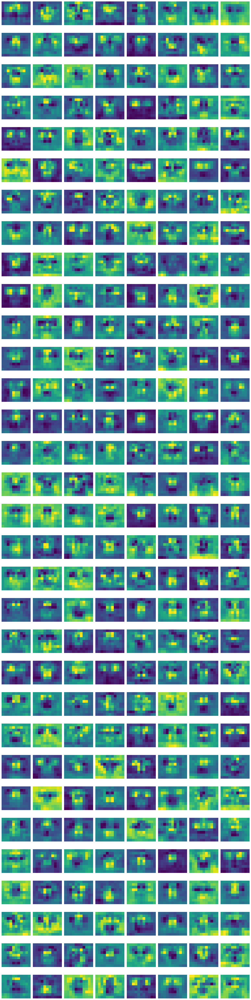

In [79]:
visualize_feature_maps(transfer_model, 'conv5_block3_3_conv', image_inspect)

As we can see in the last convolutional layer there are a lot higher activations (the bright colors). We have feature maps higher activations that looks like a person in T-pose. This is a good sign about the generalization of the model, but they aren't a lot. We can consider further fine tunning of this layer.

### **Custom CNN**

In [80]:
image_inspect = load_and_preprocess_image(image_path, (224,224), use_resnet_preprocessing=False)

1/1 [==============================] - 0s 81ms/step


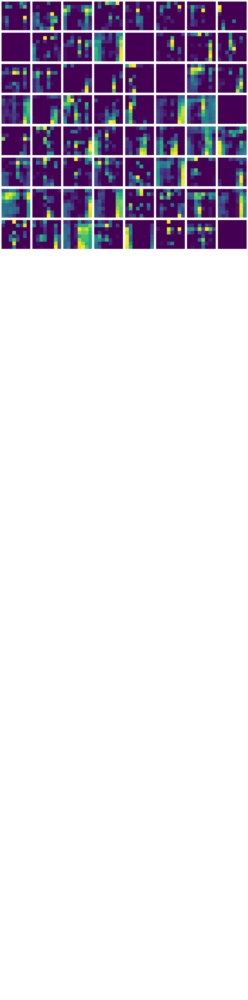

In [81]:
visualize_feature_maps(custom_model, 'conv2d_4', image_inspect)

As expected we see alot less activations and a lot more unorganized masks. The activation patterns in Resnet maps are more complex and could indicate a more nuanced understanding of the T-pose. No wonder its perfomance is better.

## **8. Model interpretation and validation on real image**

We will use Grad-CAM to interpret how the model "sees" our data. We will compare the results between our models and will test with annotated real human image.

### **8.1. Saliency map**

Saliency maps are visualizations that show which parts of the input data (such as an image) a neural network model is focusing on when making predictions. 

### **ResNet**

In [82]:
# image path and a model
image_path = PROJECT+'/images/female_1.png'

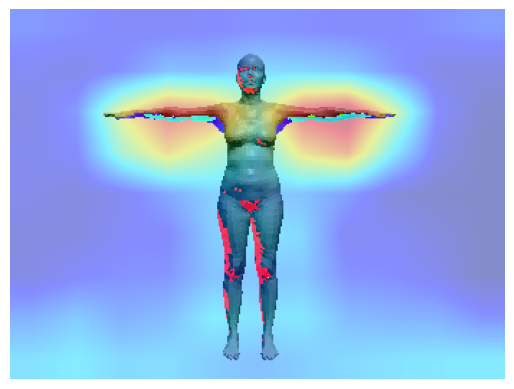

In [83]:
# Generate and superimpose heatmap
img = load_and_preprocess_image(image_path, (257,344), True)
heatmap = create_heatmap(transfer_model, img, "conv5_block3_out")
superimposed_img = superimpose_heatmap(heatmap, img)
# Convert BGR to RGB
superimposed_img_rgb = cvtColor(superimposed_img, COLOR_BGR2RGB)

# Now use matplotlib to display the image
plt.imshow(superimposed_img_rgb)
plt.axis('off')  # To not display axis
plt.show()


The map shpw which parts of the input data are triggering the strongest responses in the neural network. As we can see the model pays attention to the body parts of interest. The brighter color are around our areas of interest of the human body the stronger the activation in the feature map. The areas on the hands, feet, and head that are highlighted suggest those are key regions the model is focusing on to make its predictions or analyses. 


### **Custom CNN**

In [84]:
# image path and a model
image_path = PROJECT+'/images/female_1-224x224.png'

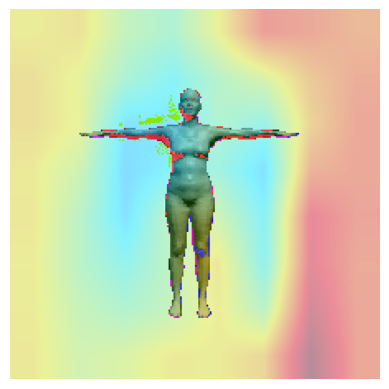

In [85]:
# Generate and superimpose heatmap
img = load_and_preprocess_image(image_path, (224,224),True)
heatmap = create_heatmap(custom_model, img, "conv2d_4")
superimposed_img = superimpose_heatmap(heatmap, img)
# Convert BGR to RGB
superimposed_img_rgb = cvtColor(superimposed_img, COLOR_BGR2RGB)

# Now use matplotlib to display the image
plt.imshow(superimposed_img_rgb)
plt.axis('off')  # To not display axis
plt.show()


We have fewer regions of intense color, suggesting fewer or more focused areas of high but wrong activations .The model sees not only the numan body but the background too. Looks like its not concentrated over the body parts as the ResNet model.

## **8.2. Saliency map and body measures from annotated real human images in T-pose**

### **ResNet**

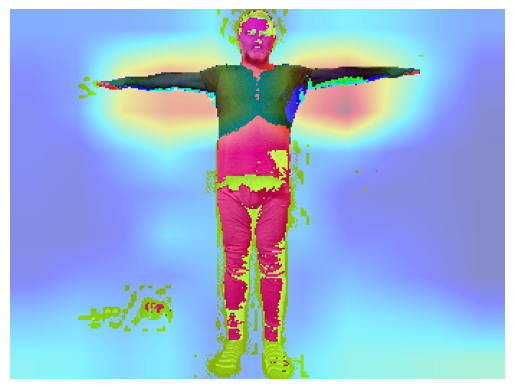

In [86]:
# image path and a model
image_path = PROJECT+'/images/resized_real_person.jpg'
# Generate and superimpose heatmap
img = load_and_preprocess_image(image_path, (257,344), True)
heatmap = create_heatmap(transfer_model, img, "conv5_block3_out")
superimposed_img = superimpose_heatmap(heatmap, img)
# Convert BGR to RGB
superimposed_img_rgb = cvtColor(superimposed_img, COLOR_BGR2RGB)

# Now use matplotlib to display the image
plt.imshow(superimposed_img_rgb)
plt.axis('off')  # To not display axis
plt.show()



In general the model can distinguish that there is a person on the picture. But we can see that the map doesn't cover the whole arm span. It is expected as the biggest MAE was exactly when the model predicted the arm span of the person on the picture. We can see that the model catches artefacts too. This is because all training data is with black background. A good idea is to augment the training set and include images with people on different backgrounds.

### **Custom CNN**

In [ ]:
img_path = PROJECT+'/images/real_person-224x224.png'
# Generate and superimpose heatmap
img = load_and_preprocess_image(image_path, (224,224),True)
heatmap = create_heatmap(custom_model, img, "conv2d_4")
superimposed_img = superimpose_heatmap(heatmap, img)
# Convert BGR to RGB
superimposed_img_rgb = cvtColor(superimposed_img, COLOR_BGR2RGB)

# Now use matplotlib to display the image
plt.imshow(superimposed_img_rgb)
plt.axis('off')  # To not display axis
plt.show()



### **Inference**

We will predict the measurements with ResNet model as it performs better.

In [90]:
# Load and preprocess the image
img_path = PROJECT+'/images/resized_real_person.jpg'
img = image.load_img(img_path, target_size=(257, 344))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = tf.keras.applications.resnet50.preprocess_input(img_array)

# Predict using the trained model
predictions = transfer_model.predict(img_array)

# Assuming the model predicts an array of measurements
predicted_measurements = predictions[0]
print("Predicted Measurements:", predicted_measurements)


1/1 [==============================] - 0s 124ms/step
Predicted Measurements: [117.529884 103.13246  109.46151   32.16703   31.223581  56.27446
  34.96901   39.737892  67.82678   35.123375  55.080147  14.60487
 140.69122   31.75644   48.053646  63.74579 ]


Creating annotations for the real person image

In [91]:
real_person = {"chest_circ": 110, "waist_circ": 110, "pelvis_circ": 105,
               "neck_circ": 42, 	"bicep_circ": 32, "thigh_circ": 52,
               "knee_circ": 36, 	"arm_length": 55, "leg_length": 73,
               "calf_length": 39, 	"head_circ": 60, 	"wrist_circ": 20,
               "arm_span": 177, 	"shoulders_width": 41,  	"torso_length": 40,
               "inner_leg": 68, 	"filename": "resized_real_person.jpg"}

In [92]:
test_male = pd.read_csv("datasets/test_male.csv")

In [93]:
print(type(test_male))

<class 'pandas.core.frame.DataFrame'>


Adding real person to test data

In [95]:
# test_male = test_male.append(real_person, ignore_index = True)
test_male.loc[len(test_male)] = real_person

In [100]:
test_male

,id,chest_circ,waist_circ,pelvis_circ,neck_circ,bicep_circ,thigh_circ,knee_circ,arm_length,leg_length,calf_length,head_circ,wrist_circ,arm_span,shoulders_width,torso_length,inner_leg
0,49900.0,99.791452,95.395931,106.535206,39.966846,33.600932,58.084488,40.603738,49.546790,74.781096,38.832557,59.347175,17.993347,174.5085,38.019499,52.896798,67.678703
1,49901.0,103.271724,94.752362,109.956615,39.822055,32.994482,55.523183,40.408877,55.438113,83.309186,43.411654,58.614615,17.668454,188.9905,39.267102,51.888299,77.314897
2,49902.0,116.526946,110.040593,110.471237,40.882890,35.005911,56.565023,40.177634,53.812897,84.166497,44.220623,59.286290,18.136853,187.5328,42.125100,57.094806,79.812398
3,49903.0,115.086944,111.161181,109.225998,42.760037,32.949836,55.351634,39.687813,52.204102,76.254636,40.350696,61.454033,18.943061,184.5443,41.288397,56.122899,68.318102
4,49904.0,107.141059,104.581170,103.678979,38.887749,32.928788,47.488301,39.964334,53.880405,80.151826,41.693309,59.902250,18.634401,186.8901,39.821199,54.315704,75.775698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,49996.0,115.103511,114.460066,109.300012,44.656755,34.545378,52.940428,42.257181,54.311001,81.377059,43.463284,58.300047,19.209752,191.0497,42.578802,54.767799,76.773800
97,49997.0,94.544885,86.849998,99.684779,39.630514,27.282401,49.468082,38.994020,56.156051,83.964038,44.110027,58.274477,17.665456,188.9210,37.127000,53.404498,77.129400
98,49998.0,108.155098,103.128599,103.263557,41.163765,28.570399,45.298150,38.787903,54.521149,82.529569,43.367916,61.306122,18.412669,187.6984,39.252403,53.159702,74.828496
99,49999.0,111.358804,109.657272,107.286416,42.526290,33.366609,57.210421,42.295321,49.468201,75.136292,39.731786,60.109587,17.958620,177.3573,40.507302,52.702403,70.871598


Calculating the MAE for real person

In [101]:
absolute_differences = np.abs(predicted_measurements - test_male.iloc[-1, 1:].values)  # exclude only the first column

print("Individual MAEs:")
for i, mae in enumerate(absolute_differences):
    # Adjusted to correctly match the columns being compared
    print(f"{test_male.columns[1:][i]}: {mae}")  # Adjusted to exclude only the first column if it's non-measurement

overall_mae = np.mean(absolute_differences)
print("\nOverall MAE:", overall_mae)


Individual MAEs:
chest_circ: 7.529884338378906
waist_circ: 6.8675384521484375
pelvis_circ: 4.461509704589844
neck_circ: 9.832969665527344
bicep_circ: 0.7764186859130859
thigh_circ: 4.2744598388671875
knee_circ: 1.0309906005859375
arm_length: 15.262107849121094
leg_length: 5.1732177734375
calf_length: 3.8766250610351562
head_circ: 4.919853210449219
wrist_circ: 5.395130157470703
arm_span: 36.30877685546875
shoulders_width: 9.243560791015625
torso_length: 8.053646087646484
inner_leg: 4.25421142578125

Overall MAE: 7.953806281089783


We see that the model generalizes over real data, but bad. Worst in armspan and best in knee, biceps and calf.

## **9. Using YOLO and SAM**

We will use YOLO (You Only Look Once) to detect the person. Then we will use the bounding box as input for SAM (Segment Anything Model) to create the mask which we will use to crop the person form the original image and use it as input for our original model to infer the antropometrics of this person.

## **9.1. YOLO to detect the person**

Installing YOLO

In [ ]:
!pip install ultralytics

You have to input the path to the downloaded project here.

In [ ]:
PROJECT = "drive/MyDrive/Colab_Notebooks_Deep_Learning/100_Final_Project_DL"

In [ ]:
from ultralytics import YOLO

# Load a pretrained YOLOv8n model
model = YOLO('yolov8n.pt')

# Run inference
results = model.predict(PROJECT+'/images/real_person.jpg', save=True, imgsz=400, conf=0.9, classes=0) #LEt's say this image is took with smartphone. We use person class to detect

YOLO detected a persona and puts the image with the detected person and the bounding box in /runs/detect/predict/real_person_female.jpg

In [ ]:
image = cv2.imread('runs/detect/predict/real_person.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [ ]:
# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bbox outputs

In [ ]:
boxes

YOLO outputs the bounding box in various formats, but we will use xyxy because of SAM.

In [ ]:
for result in results:
    boxes = result.boxes
bbox = boxes.xyxy.tolist()

In [ ]:
bbox

In [ ]:
bbox[0][0] = bbox[0][0] - 10
bbox[0][2] = bbox[0][2] + 10

Little correction of the bounding box for better precision.

In [ ]:
bbox

This is the bounding box which we will feed to SAM

## **9.2. SAM makes the mask**

Installing transformers if not installed

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers

In [ ]:
from transformers import TFSamModel, SamProcessor

In [ ]:
sam_model = TFSamModel.from_pretrained("facebook/sam-vit-base")
sam_processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

In [ ]:

np_config.enable_numpy_behavior()


def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_masks_on_image(raw_image, masks, scores):
    if len(masks[0].shape) == 4:
        final_masks = tf.squeeze(masks[0])
    if scores.shape[0] == 1:
        final_scores = tf.squeeze(scores)

    nb_predictions = scores.shape[-1]
    fig, axes = plt.subplots(1, nb_predictions, figsize=(15, 15))

    for i, (mask, score) in enumerate(zip(final_masks, final_scores)):
        mask = tf.stop_gradient(mask)
        axes[i].imshow(np.array(raw_image))
        show_mask(mask, axes[i])
        axes[i].title.set_text(f"Mask {i+1}, Score: {score.numpy().item():.3f}")
        axes[i].axis("off")
    plt.show()


Using the bounding box from YOLO

In [ ]:
bbox = np.expand_dims(bbox, axis=0)

In [ ]:
bbox = bbox.tolist()

In [ ]:
# Preprocess the input image.
# inputs = processor(image, input_points=input_points, return_tensors="tf")
sam_inputs = sam_processor(image, input_boxes=bbox, return_tensors="tf")

# Predict for segmentation with the prompt.
sam_outputs = sam_model(**sam_inputs)

Reading test image.

In [ ]:
sam_image = cv2.imread(PROJECT+'/images/real_person.jpg')

In [ ]:
masks = sam_processor.image_processor.post_process_masks(
    sam_outputs.pred_masks,
    sam_inputs["original_sizes"],
    sam_inputs["reshaped_input_sizes"],
    return_tensors="tf",
)

show_masks_on_image(sam_image, masks, sam_outputs.iou_scores)

In [ ]:
masks

We take the first from 3 masks with higher Inteception over Union result.

In [ ]:
mask = masks[0][0][0]

In [ ]:
mask.shape

We make the mask with 3 channels

In [ ]:
mask_3_channels = np.stack((masks,)*3, axis=-1)

In [ ]:
mask_3_channels.shape

We make binary mask

In [ ]:
binary_mask = mask_3_channels.astype(np.uint8) * 255

In [ ]:
binary_mask

In the end we crop the image multiplying the image with the binary mask bitwise.

In [ ]:
cropped_image = cv2.bitwise_and(image, binary_mask)

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow(cropped_image)
plt.show()

## **10. Conclusions**

- Not a meaningfull bias or variance were detected during the training process. If we assume that the BOE is the error that a person would make when measuring the human body with a tape measure, then it would vary within 0.5 to 1 cm (after all the human body is not a solid object). Both our training and validation errors are within this interval. Regarding the variability of the models, there are also no particular deviations between the training and validation errors. The learning and validation curves fall off and converge well.

- We used a number of CNN's and ensembles to extract the 16 features from the synthetic dataset. We proved that the ResNet model achieves best results with our test data. As we saw it extracts more and better features from the synthetic data, but doesn't do well with real images. a model with ResNet feature extractor part works best for our task. We concluded that a future fine-tuning with real pictures will improve the results. 

- We used two other models YOLO and SAM and proved that we can detect a person from a picture and extract his/hers mask in an image which can be used as input to our regression model.


## **11. Feature work**

An annotated dataset with humans in different poses can be aquired from fashion agencies. It can be used with a pretrained pose detection model as training data for fine tunning of the model. This way it will detect antropomentrics from humans in different poses. An encoder decoder model could be trained to generalize anthropomentrics from images. Experiments with ViT only as feature extractor. Integration of the two datasets male and female in one model.

## **12. References**

-  "Anthropometric measurements for ergonomic design of students’furniture in India (Ismail Wilson Taifa a,⇑, Darshak A. Desai")
-  "Automatic Estimation of Anthropometric Human Body Measurements" Dana Škorvánková, Adam Riečický, Martin Madaras
-  "CALVIS: chest, waist and pelvis circumference from 3D human body meshes as ground truth for deep learning" Yansel Gonzalez Tejeda, Helmut Mayer
-  "SMPL: A Skinned Multi-Person Linear Model" Matthew Loper Naureen Mahmood†1 Javier Romero†1 Gerard Pons-Moll†1 Michael J. Black†1 1Max Planck Institute for Intelligent Systems, T¨ubingen, Germany2Industrial Light and Magic, San Francisco, CA
-  SAM & YOLO example code
-  Chat GPT